<a href="https://colab.research.google.com/github/baileynoelle1/scRNA-seq-Data-Analysis/blob/main/QCScript.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# Install tools

!pip install scanpy anndata numpy pandas scipy matplotlib seaborn igraph leidenalg pynndescent harmonypy

!pip install scvi-tools

!pip install scvelo

!pip install pyarrow openpyxl statsmodels

!pip install infercnvpy>=0.4 pyscenic>=0.12

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 96.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 172.3/172.3 kB 19.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.7/5.7 MB 149.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.7/2.7 MB 106.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.2/58.2 kB 6.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 284.1/284.1 kB 29.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.2/9.2 MB 148.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.4/42.4 kB 4.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 628.9/628.9 kB 49.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 827.9/827.9 kB 65.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 259.4/259.4 kB 27.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 983.2/983.2 kB 73.9 MB/s eta 0:00:00
   ━

In [ ]:
# Mount Google Drive

from google.colab import drive
drive.mount('/content/drive')

import os
import scanpy as sc
import numpy as np
import pandas as pd

sc.settings.verbosity = 3
sc.set_figure_params(dpi=130)

Mounted at /content/drive


In [ ]:
# Define paths
# Raw data files are FILE_SL040 and FILE_SL057

PROJECT_ROOT = "/content/drive/MyDrive/GBM_Project"


DATA_DIR = os.path.join(PROJECT_ROOT, "data", "cellxgene")


OUT_DIR = os.path.join(PROJECT_ROOT, "outputs")
FIG_DIR = os.path.join(OUT_DIR, "figures")
H5AD_DIR = os.path.join(OUT_DIR, "h5ad")


os.makedirs(FIG_DIR, exist_ok=True)
os.makedirs(H5AD_DIR, exist_ok=True)

sc.settings.figdir = FIG_DIR

FILE_SL040 = os.path.join(DATA_DIR, "SL040.h5ad")
FILE_SL057 = os.path.join(DATA_DIR, "SL057.h5ad")

print("Checking files:")
print(" SL040:", os.path.exists(FILE_SL040))
print(" SL057:", os.path.exists(FILE_SL057))

Checking files:
 SL040: True
 SL057: True


In [ ]:
# Load raw data
# Raw adata is ad40_raw and ad57_raw

ad40_raw = sc.read_h5ad(FILE_SL040)
ad40_raw.var_names_make_unique()

ad57_raw = sc.read_h5ad(FILE_SL057)
ad57_raw.var_names_make_unique()

print("SL040 shape:", ad40_raw.shape)
print("SL057 shape:", ad57_raw.shape)

SL040 shape: (135482, 58234)
SL057 shape: (123236, 58234)


In [ ]:
# Detect batch column

def find_batch_column(adata):
    preferred = ["sample", "tumor", "subject", "batch", "donor"]
    for col in preferred:
        if col in adata.obs and adata.obs[col].nunique() > 1:
            return col


    for col in adata.obs.columns:
        if adata.obs[col].dtype.name in ("category", "object") and adata.obs[col].nunique() > 1:
            return col

    return None

In [ ]:
# QC plots

def make_qc_plots(adata, tag):
    sc.pl.violin(
        adata,
        ["n_genes_by_counts", "total_counts", "pct_counts_mt"],
        jitter=0.4,
        multi_panel=True,
        save=f"_{tag}_qc_violin.png"
    )
    sc.pl.scatter(adata, x="total_counts", y="pct_counts_mt",
                  save=f"_{tag}_qc_counts_vs_mt.png")
    sc.pl.scatter(adata, x="total_counts", y="n_genes_by_counts",
                  save=f"_{tag}_qc_counts_vs_genes.png")

In [ ]:
# Full processing pipeline

def run_basic_processing(
    adata,
    tag,
    mito_cutoff=15,
    min_genes=200,
    n_hvg=4000,
    n_pcs=50,
    leiden_res=0.8,
):

    # Mitochondrial detection

    if "feature_name" in adata.var:
        adata.var["mt"] = adata.var["feature_name"].str.upper().str.startswith("MT-")
    elif "gene_name" in adata.var:
        adata.var["mt"] = adata.var["gene_name"].str.upper().str.startswith("MT-")
    elif "chromosome" in adata.var:
        adata.var["mt"] = adata.var["chromosome"].astype(str).str.upper().isin(["MT", "CHRM"])
    else:
        raise KeyError("No suitable column (feature_name/gene_name/chromosome) found to flag MT genes.")

    print(f"[{tag}] MT genes detected: {adata.var['mt'].sum()}")

    # Calculate QC metrics

    sc.pp.calculate_qc_metrics(adata, qc_vars=["mt"], inplace=True)
    make_qc_plots(adata, f"{tag}_BEFORE")

    # Filtering

    keep = (adata.obs.n_genes_by_counts >= min_genes) & (adata.obs.pct_counts_mt < mito_cutoff)
    adata = adata[keep].copy()

    make_qc_plots(adata, f"{tag}_AFTER")

    # Normalization & HVGs

    sc.pp.normalize_total(adata, target_sum=1e4)
    sc.pp.log1p(adata)
    sc.pp.highly_variable_genes(adata, flavor="seurat_v3", n_top_genes=n_hvg, subset=True)

    # PCA

    sc.pp.scale(adata, max_value=10)
    sc.tl.pca(adata, n_comps=n_pcs)

    # Harmony batch key

    import harmonypy as hm
    batch_key = find_batch_column(adata)

    if batch_key is None:
        print(f"[{tag}] No batch column detected → running Harmony with no covariates")
        ho = hm.run_harmony(adata.obsm["X_pca"], adata.obs, None)
    else:
        print(f"[{tag}] Using Harmony batch key: {batch_key}")
        ho = hm.run_harmony(adata.obsm["X_pca"], adata.obs, batch_key)

    adata.obsm["X_pca_harmony"] = ho.Z_corr.T

    # Neighbors / UMAP / Leiden

    sc.pp.neighbors(adata, use_rep="X_pca_harmony", n_neighbors=30)
    sc.tl.umap(adata)
    sc.tl.leiden(adata, resolution=leiden_res)

    sc.pl.umap(
        adata,
        color=["n_genes_by_counts", "pct_counts_mt", "leiden"],
        save=f"_{tag}_UMAP_qc.png"
    )

    return adata



In [ ]:
# CNV-ready copy

def make_cnv_ready_copy(adata_raw, adata_clean, tag):
    filtered_cells = adata_clean.obs_names
    adata_cnv = adata_raw[filtered_cells].copy()

    if "chromosome" in adata_cnv.var:
        adata_cnv.var["chromosome"] = adata_cnv.var["chromosome"].astype(str)

    print(f"[{tag}] CNV-ready shape:", adata_cnv.shape)
    return adata_cnv

[SL040] MT genes detected: 37


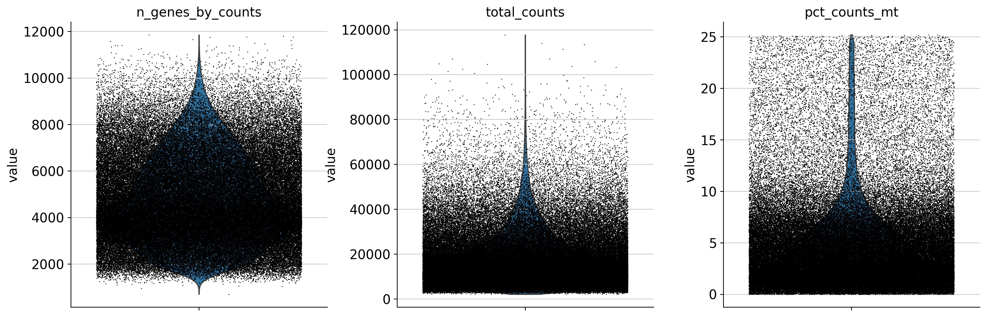

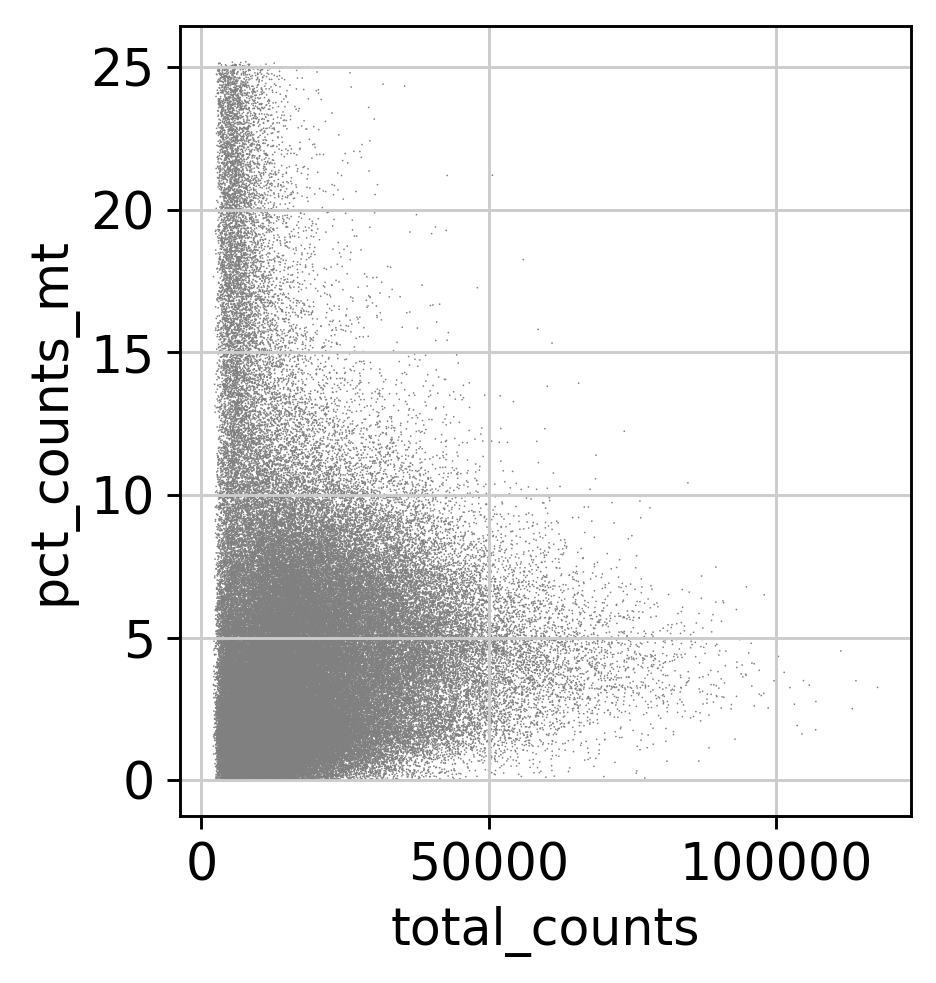

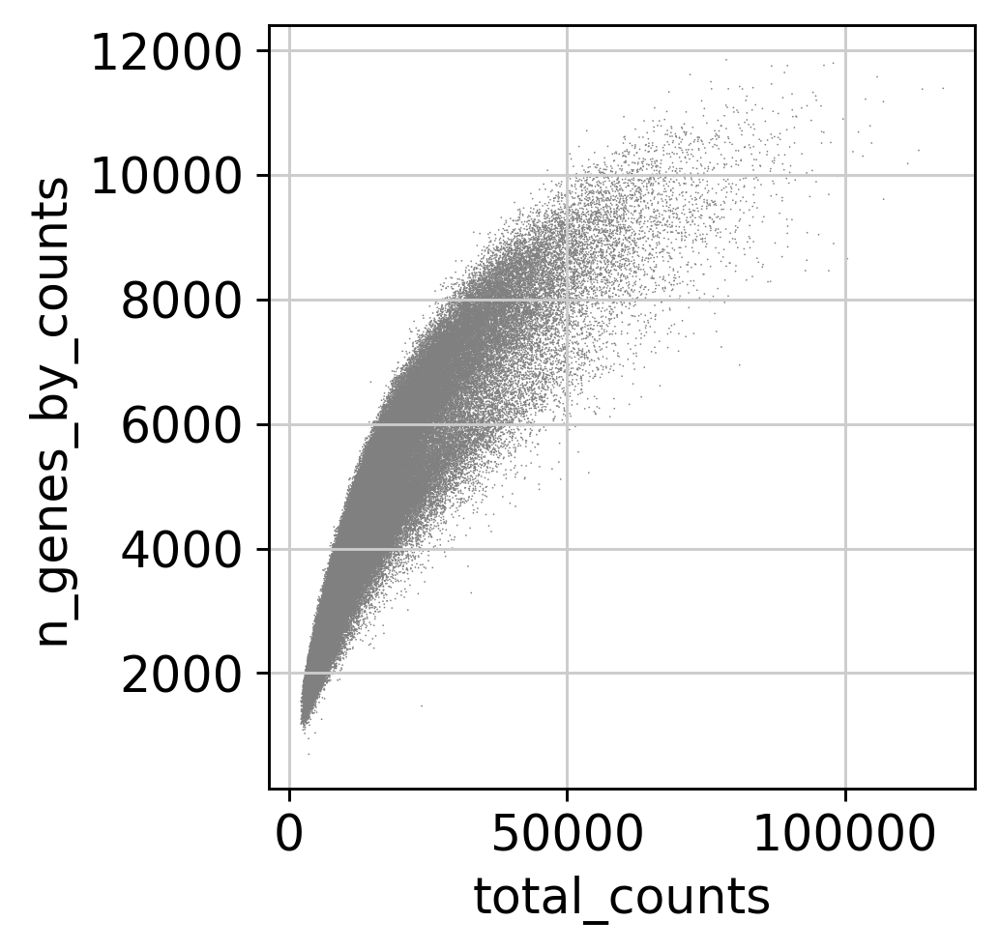

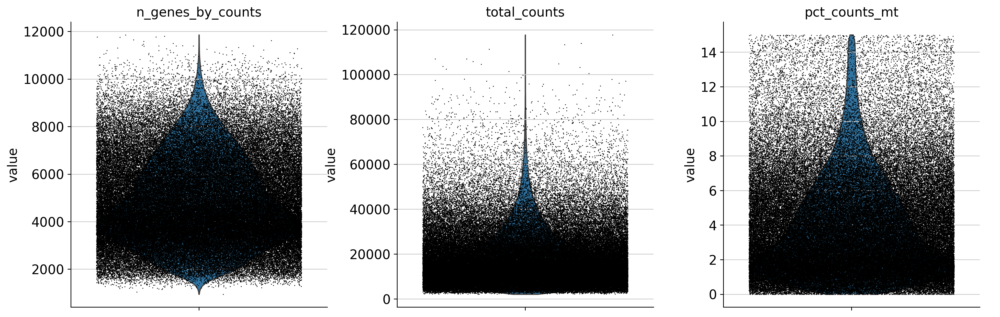

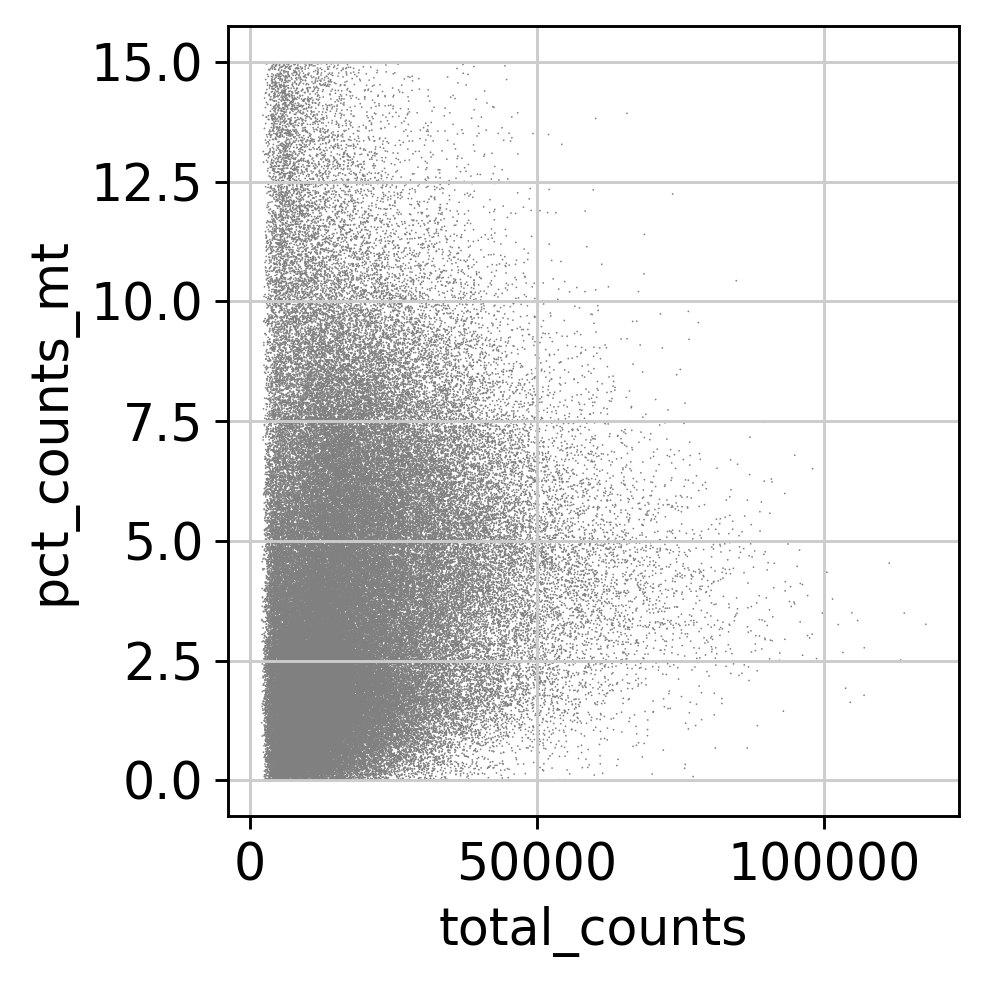

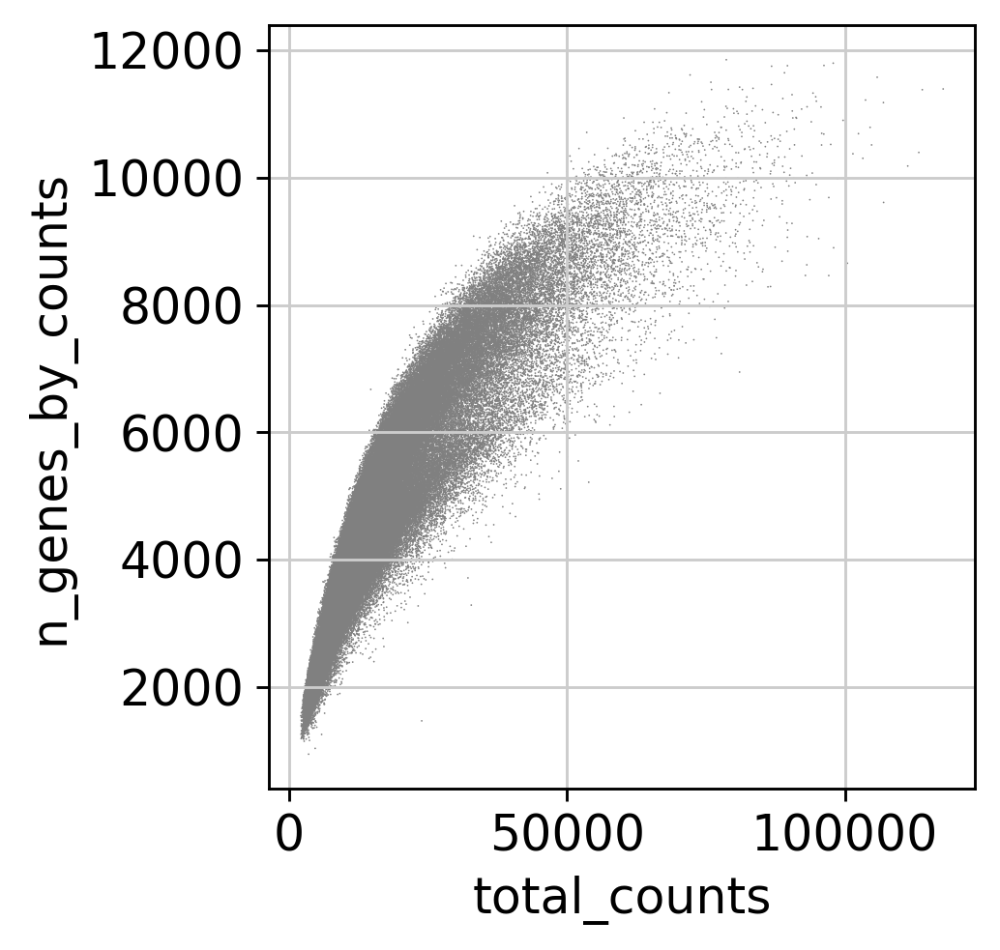

normalizing counts per cell
    finished (0:00:04)
extracting highly variable genes


/usr/local/lib/python3.12/dist-packages/legacy_api_wrap/__init__.py:88: UserWarning: `flavor='seurat_v3'` expects raw count data, but non-integers were found.
  return fn(*args_all, **kw)


--> added
    'highly_variable', boolean vector (adata.var)
    'highly_variable_rank', float vector (adata.var)
    'means', float vector (adata.var)
    'variances', float vector (adata.var)
    'variances_norm', float vector (adata.var)


/usr/lib/python3.12/functools.py:912: UserWarning: zero-centering a sparse array/matrix densifies it.
  return dispatch(args[0].__class__)(*args, **kw)


computing PCA
    with n_comps=50
    finished (0:00:32)


2025-11-27 00:16:02,129 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
INFO:harmonypy:Computing initial centroids with sklearn.KMeans...


[SL040] Using Harmony batch key: Fluorescence


2025-11-27 00:16:29,914 - harmonypy - INFO - sklearn.KMeans initialization complete.
INFO:harmonypy:sklearn.KMeans initialization complete.
2025-11-27 00:16:30,507 - harmonypy - INFO - Iteration 1 of 10
INFO:harmonypy:Iteration 1 of 10
2025-11-27 00:17:28,785 - harmonypy - INFO - Iteration 2 of 10
INFO:harmonypy:Iteration 2 of 10
2025-11-27 00:18:26,869 - harmonypy - INFO - Iteration 3 of 10
INFO:harmonypy:Iteration 3 of 10
2025-11-27 00:19:24,815 - harmonypy - INFO - Iteration 4 of 10
INFO:harmonypy:Iteration 4 of 10
2025-11-27 00:20:22,631 - harmonypy - INFO - Iteration 5 of 10
INFO:harmonypy:Iteration 5 of 10
2025-11-27 00:21:20,520 - harmonypy - INFO - Iteration 6 of 10
INFO:harmonypy:Iteration 6 of 10
2025-11-27 00:22:18,754 - harmonypy - INFO - Iteration 7 of 10
INFO:harmonypy:Iteration 7 of 10
2025-11-27 00:23:16,035 - harmonypy - INFO - Iteration 8 of 10
INFO:harmonypy:Iteration 8 of 10
2025-11-27 00:24:14,239 - harmonypy - INFO - Iteration 9 of 10
INFO:harmonypy:Iteration 9 of

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:01:29)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm)
    'umap', UMAP parameters (adata.uns) (0:02:41)
running Leiden clustering


/tmp/ipython-input-2202110468.py:58: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.
  sc.tl.leiden(adata, resolution=leiden_res)


    finished: found 27 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:04:03)


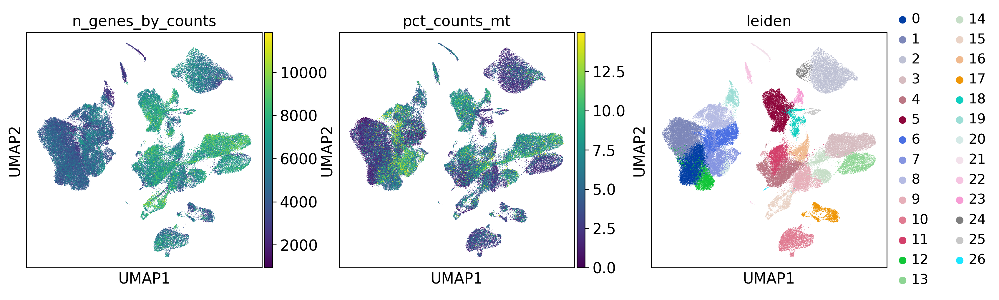

[SL040] CNV-ready shape: (129491, 58234)
SL040 DONE.


In [ ]:
# Process SL040
# Adata for SL040 full pipeline is ad40_clean
# Adata for SL040 CNV-ready pipeline is ad40_cnv

ad40_clean = run_basic_processing(ad40_raw, tag="SL040")
ad40_cnv = make_cnv_ready_copy(ad40_raw, ad40_clean, tag="SL040")

ad40_clean.write(os.path.join(H5AD_DIR, "SL040_cleaned.h5ad"))
ad40_cnv.write(os.path.join(H5AD_DIR, "SL040_cnv_ready.h5ad"))

print("SL040 DONE.")

[SL057] MT genes detected: 37


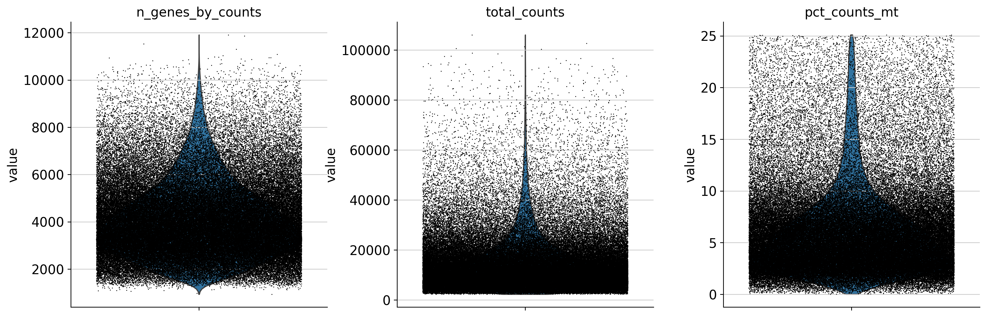

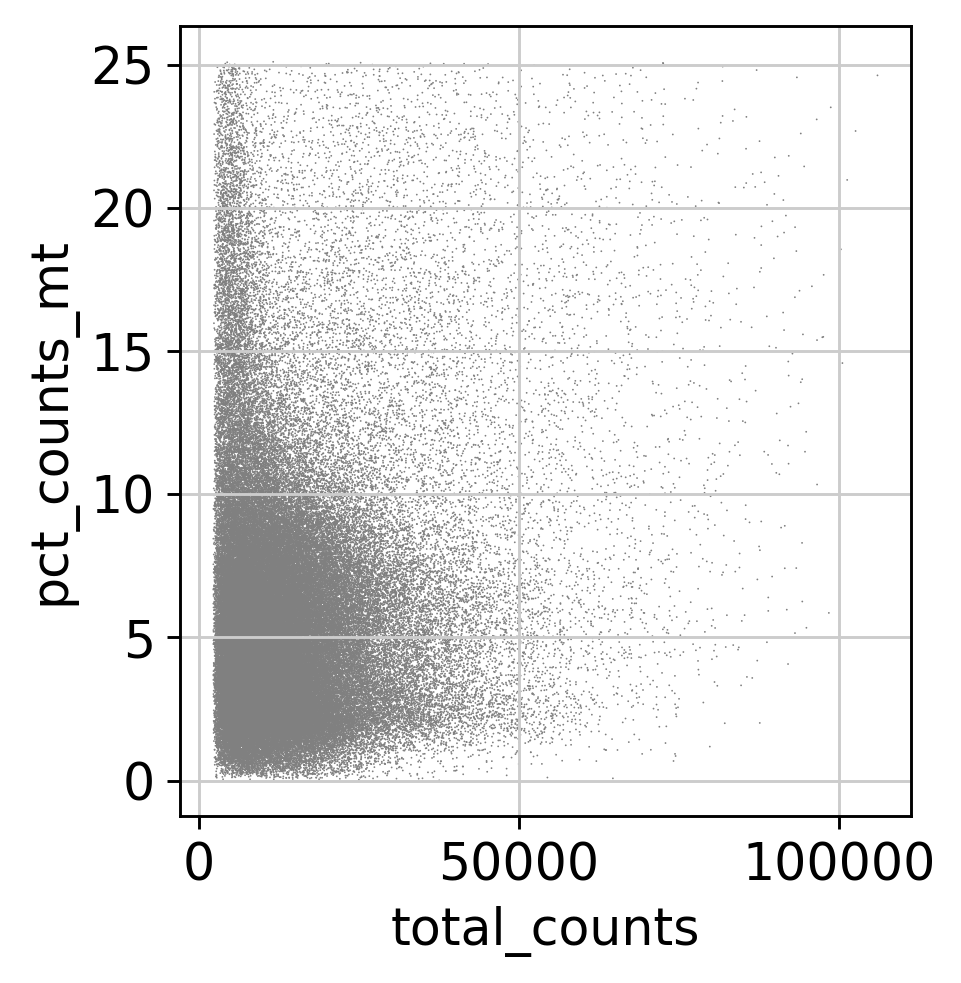

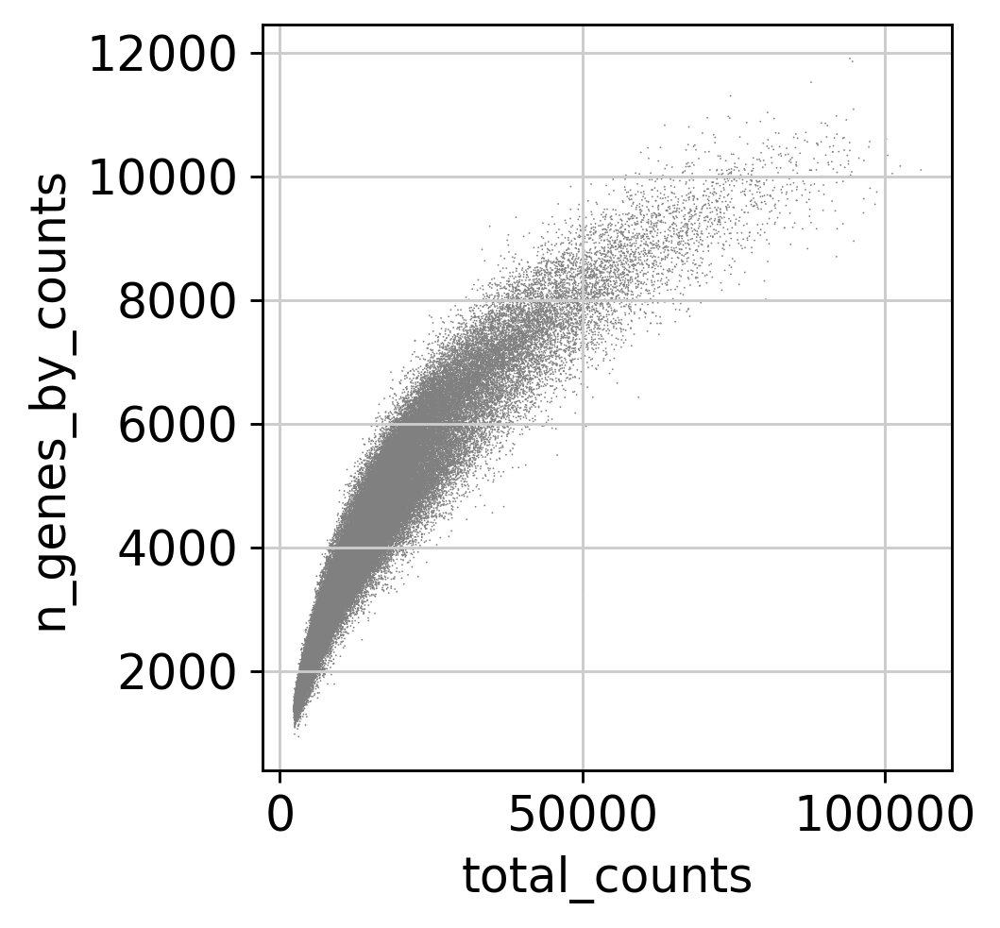

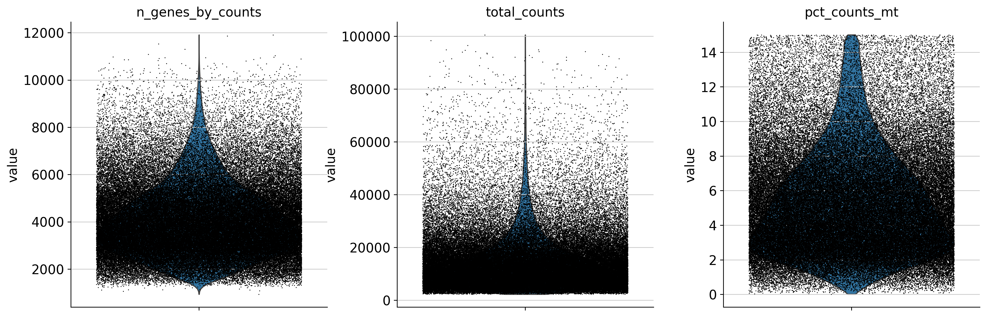

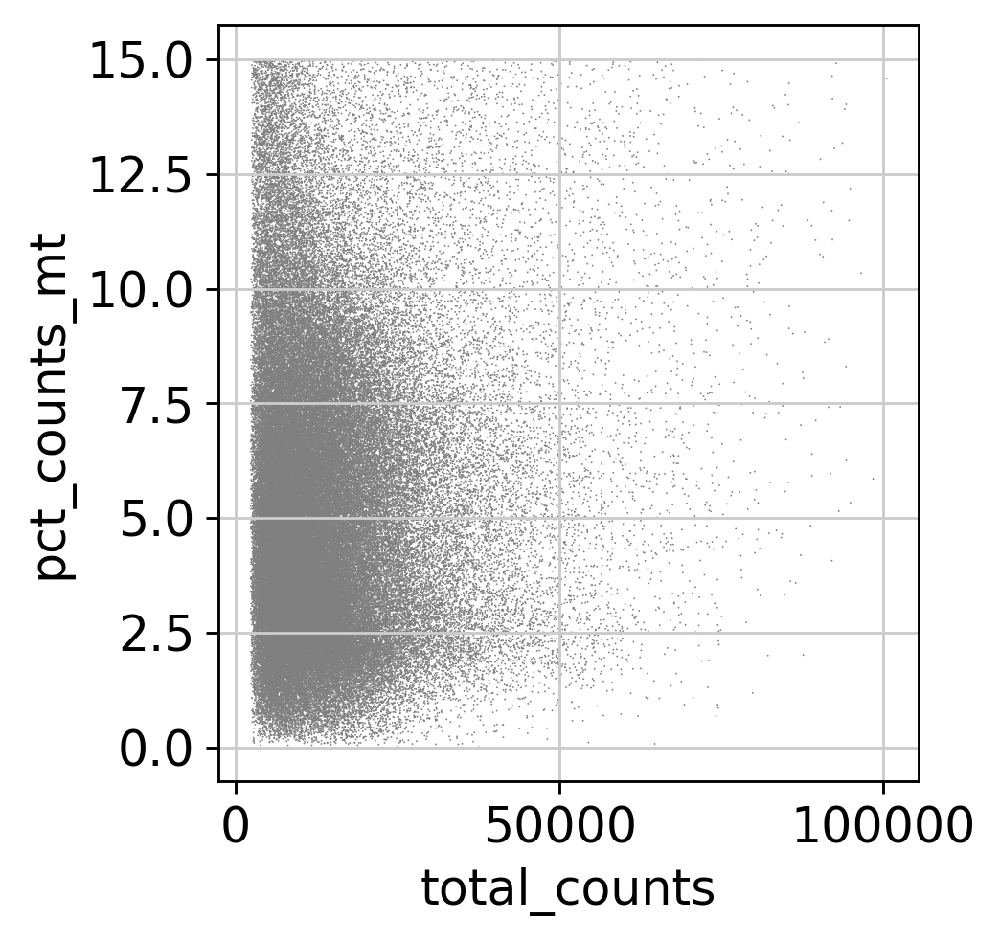

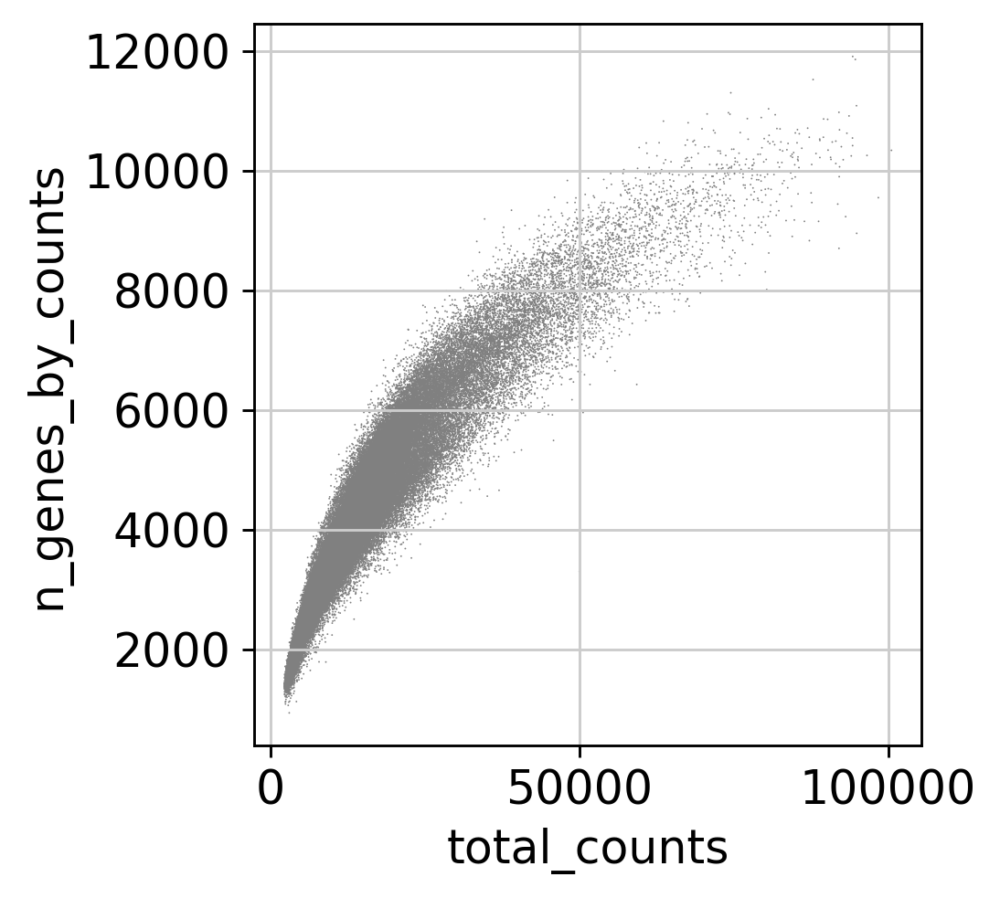

normalizing counts per cell
    finished (0:00:01)
extracting highly variable genes


/usr/local/lib/python3.12/dist-packages/legacy_api_wrap/__init__.py:88: UserWarning: `flavor='seurat_v3'` expects raw count data, but non-integers were found.
  return fn(*args_all, **kw)


--> added
    'highly_variable', boolean vector (adata.var)
    'highly_variable_rank', float vector (adata.var)
    'means', float vector (adata.var)
    'variances', float vector (adata.var)
    'variances_norm', float vector (adata.var)


/usr/lib/python3.12/functools.py:912: UserWarning: zero-centering a sparse array/matrix densifies it.
  return dispatch(args[0].__class__)(*args, **kw)


computing PCA
    with n_comps=50
    finished (0:00:30)


2025-11-27 00:41:35,758 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
INFO:harmonypy:Computing initial centroids with sklearn.KMeans...


[SL057] Using Harmony batch key: Location


2025-11-27 00:42:01,227 - harmonypy - INFO - sklearn.KMeans initialization complete.
INFO:harmonypy:sklearn.KMeans initialization complete.
2025-11-27 00:42:01,763 - harmonypy - INFO - Iteration 1 of 10
INFO:harmonypy:Iteration 1 of 10
2025-11-27 00:42:49,992 - harmonypy - INFO - Iteration 2 of 10
INFO:harmonypy:Iteration 2 of 10
2025-11-27 00:43:37,800 - harmonypy - INFO - Iteration 3 of 10
INFO:harmonypy:Iteration 3 of 10
2025-11-27 00:44:25,185 - harmonypy - INFO - Iteration 4 of 10
INFO:harmonypy:Iteration 4 of 10
2025-11-27 00:45:11,659 - harmonypy - INFO - Iteration 5 of 10
INFO:harmonypy:Iteration 5 of 10
2025-11-27 00:46:00,421 - harmonypy - INFO - Iteration 6 of 10
INFO:harmonypy:Iteration 6 of 10
2025-11-27 00:46:49,095 - harmonypy - INFO - Converged after 6 iterations
INFO:harmonypy:Converged after 6 iterations


computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:31)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm)
    'umap', UMAP parameters (adata.uns) (0:02:23)
running Leiden clustering
    finished: found 22 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:04:46)


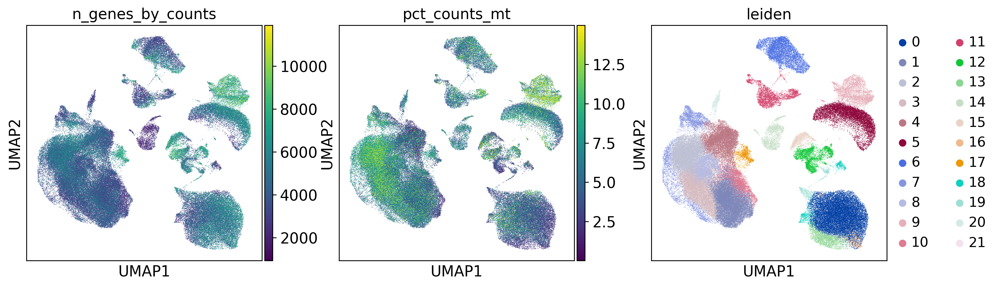

[SL057] CNV-ready shape: (116143, 58234)
SL057 DONE.


In [14]:
# Process SL057
# Adata for SL057 full pipeline is ad57_clean
# Adata for SL057 CNV-ready pipeline is ad57_cnv

ad57_clean = run_basic_processing(ad57_raw, tag="SL057")
ad57_cnv = make_cnv_ready_copy(ad57_raw, ad57_clean, tag="SL057")

ad57_clean.write(os.path.join(H5AD_DIR, "SL057_cleaned.h5ad"))
ad57_cnv.write(os.path.join(H5AD_DIR, "SL057_cnv_ready.h5ad"))

print("SL057 DONE.")

computing PCA
    with n_comps=50
    finished (0:01:21)


2025-11-27 00:59:11,178 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
INFO:harmonypy:Computing initial centroids with sklearn.KMeans...
2025-11-27 01:00:04,250 - harmonypy - INFO - sklearn.KMeans initialization complete.
INFO:harmonypy:sklearn.KMeans initialization complete.
2025-11-27 01:00:05,311 - harmonypy - INFO - Iteration 1 of 10
INFO:harmonypy:Iteration 1 of 10
2025-11-27 01:02:00,039 - harmonypy - INFO - Iteration 2 of 10
INFO:harmonypy:Iteration 2 of 10
2025-11-27 01:03:55,890 - harmonypy - INFO - Iteration 3 of 10
INFO:harmonypy:Iteration 3 of 10
2025-11-27 01:05:50,629 - harmonypy - INFO - Iteration 4 of 10
INFO:harmonypy:Iteration 4 of 10
2025-11-27 01:07:46,298 - harmonypy - INFO - Iteration 5 of 10
INFO:harmonypy:Iteration 5 of 10
2025-11-27 01:09:40,155 - harmonypy - INFO - Converged after 5 iterations
INFO:harmonypy:Converged after 5 iterations


computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:01:09)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm)
    'umap', UMAP parameters (adata.uns) (0:05:45)
running Leiden clustering
    finished: found 29 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:13:56)


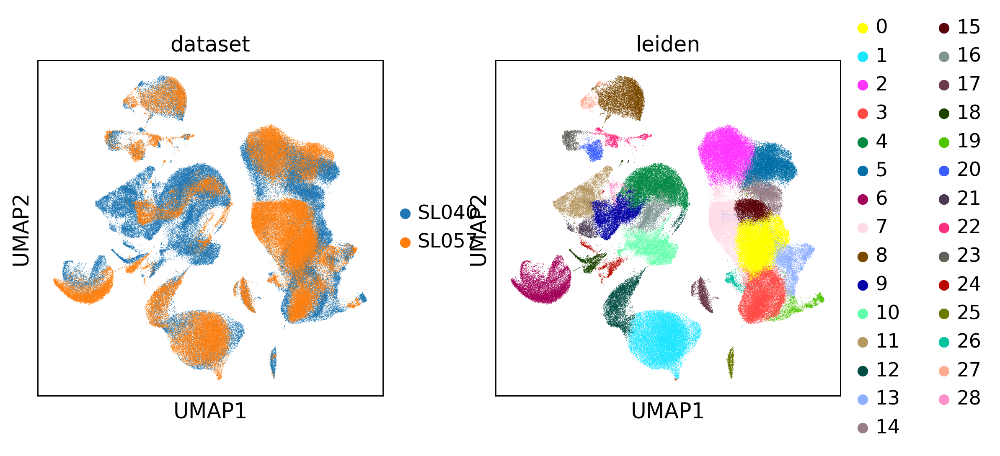

Integration complete.


In [15]:
# Merge for integration
# Adata for SL040 and SL057 combined full pipeline is ad_comb

ad_comb = sc.concat(
    [ad40_clean, ad57_clean],
    label="dataset",
    keys=["SL040", "SL057"],
    join="outer",
    fill_value=0
)
ad_comb.var_names_make_unique()

import harmonypy as hm
sc.pp.pca(ad_comb, n_comps=50)

h_comb = hm.run_harmony(ad_comb.obsm["X_pca"], ad_comb.obs, "dataset")
ad_comb.obsm["X_pca_harmony"] = h_comb.Z_corr.T

sc.pp.neighbors(ad_comb, use_rep="X_pca_harmony", n_neighbors=30)
sc.tl.umap(ad_comb)
sc.tl.leiden(ad_comb, resolution=0.8)

sc.pl.umap(ad_comb, color=["dataset","leiden"], save="_COMBINED_Harmony_UMAP.png")

ad_comb.write(os.path.join(H5AD_DIR, "SL040_SL057_integrated.h5ad"))

print("Integration complete.")